# Histogram obrazu. Wyrównywanie histogramu.

## Cel ćwiczenia

- Zapoznanie z pojęciem histogramu obrazu (w odcieniach szarości i kolorze).
- Zapoznanie z metodami modyfikacji histogramu (rozciąganie, wyrównywanie, dopasowywanie).

## Histogram dla obrazów w odcieniach szarości

1. Zaimportuj potrzebne biblioteki: *OpenCV*, *pyplot* z *matplotlib* i *numpy*.
        import cv2
        from matplotlib import pyplot as plt
        import numpy as np
2. Wczytaj obrazy *lenaX.bmp* w skali szarości. *X* jest numerem wczytywanego obrazu (1 - 4).
        I = cv2.imread('lenaX.bmp', cv2.IMREAD_GRAYSCALE)
3. Oblicz histogram wczytanego obrazu wykorzystując funkcję `cv2.calcHist`.
    - Pierwszym argumentem jest obraz, dla którego obliczony zostanie histogram.
    Należy go przekazać w nawiasie kwadratowym.
    - Drugim argumentem jest numer kanału, dla którego ma zostać obliczony histogram.
    Również powinien być przekazany w nawiasie kwadratowym.
    - Trzeci argument oznacza maskę, czyli obszar, dla którego ma zostać wyznaczony histogram.
    Aby obliczyć dla całego obrazu należy przekazać *None*.
    - Czwartym argumentem jest rozmiar histogramu (liczba przedziałów).
    Argument powinien być w nawiasie kwadratowym. Dla pełnej skali należy przekazać wartość *256*.
    - Ostatnim argumentem jest zakres wartości. Dla obrazów typu *uint8* powinien on wynosić *[0, 256]*.
    - Funkcja zwraca obliczony histogram.
4. Wyświetl wczytane obrazy i ich histogramy w jednym oknie. Użyj `plt.subplot()` w celu stworzenia siatki wykresów.
        figLena, axsLena = plt.subplots(2, 4)
Rozmiar utworzonego okna można zmienić wykorzystując instrukcję (uwaga w calach -  1 cal to 2.54cm):
        figLena.set_size_inches(20, 10)
Przykładowe wyświetlenie obrazu:
        axsLena[0, 0].imshow(I1, 'gray', vmin=0, vmax=256)
        axsLena[0, 0].axis('off')
Przykładowe wyświetlenie histogramu:
        axsLena[1, 0].plot(H1)
        axsLena[1, 0].grid()
5. Przeanalizuj (dokładnie) związek histogramu z jasnością i ostrością obrazu (tu rozumianą jako subiektywne odczucie).

In [2]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/03_Histogram/'

fileName = 'lena1.bmp'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

fileName = 'lena2.bmp'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

fileName = 'lena3.bmp'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

fileName = 'lena4.bmp'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

In [3]:
I1 = cv2.imread('lena1.bmp', cv2.IMREAD_GRAYSCALE)
I2 = cv2.imread('lena2.bmp', cv2.IMREAD_GRAYSCALE)
I3 = cv2.imread('lena3.bmp', cv2.IMREAD_GRAYSCALE)
I4 = cv2.imread('lena4.bmp', cv2.IMREAD_GRAYSCALE)

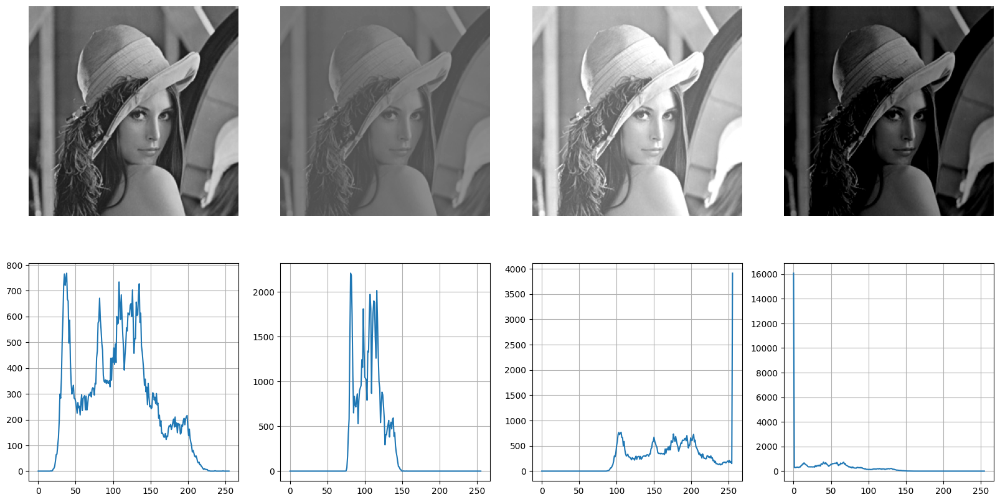

In [4]:
figLena, axsLena = plt.subplots(2, 4)
figLena.set_size_inches(20, 10)

for i, img in enumerate([I1, I2, I3, I4]):
    axsLena[0, i].imshow(img, 'gray', vmin=0, vmax=256)
    axsLena[0, i].axis('off')
    
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    axsLena[1, i].plot(hist)
    axsLena[1, i].grid()

## Rozciąganie histogramu

Najprostszą metodą poprawienia jakości obrazu jest tzw. rozciągnięcie histogramu.
Polega na przeskalowaniu wartości pikseli w obrazie tak, aby wykorzystać cały dostępny zakres [0-255] (oczywiście w przypadku obrazów w odcieniach szarości w reprezentacji 8-bitowej).

1. Wczytaj obraz *hist1.bmp* w skali szarości.
Oblicz i wyświetl histogram rozpatrywanego obrazu (na wspólnym rysunku z obrazem).
Zwróć uwagę na ilość widocznych szczegółów.
2. Rozciągnij histogram obrazu. W tym celu można wykorzystać funkcję `cv2.normalize`.
    - Pierwszym argumentem funkcji jest obraz poddawany operacji.
    - Drugim argumentem jest tablica do której zostanie wpisany wynik.
    Należy ją najpierw zainicjalizować.
    Najlepiej zrobić to funkcją `np.zeros`, której pierwszym argumentem jest rozmiar obrazu (`I.shape`), a drugim typ danych (`uint8`).
    Można również przekazać `None`, a wynik przypisać do nowej zmiennej.
    - Trzecim argumentem jest minimalna wartość po normalizacji.
    - Czwartym argumentem jest wartość maksymalna po normalizacji.
    - Ostatnim argumentem jest typ wykorzystanej normy (uogólnienie pojęcia długości wektora).
    Należy wykorzystać normę `cv2.NORM_MINMAX`.
3. Wyświetl obraz oryginalny, po wykonanej operacji oraz ich histogramy.
4. Czy ilość "widocznych" szczegółów uległa zmianie?

In [5]:
fileName = 'hist1.bmp'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

fileName = 'hist2.bmp'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

fileName = 'hist3.bmp'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

fileName = 'hist4.bmp'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

In [6]:
I1 = cv2.imread('hist1.bmp', cv2.IMREAD_GRAYSCALE)
I2 = cv2.imread('hist2.bmp', cv2.IMREAD_GRAYSCALE)
I3 = cv2.imread('hist3.bmp', cv2.IMREAD_GRAYSCALE)
I4 = cv2.imread('hist4.bmp', cv2.IMREAD_GRAYSCALE)

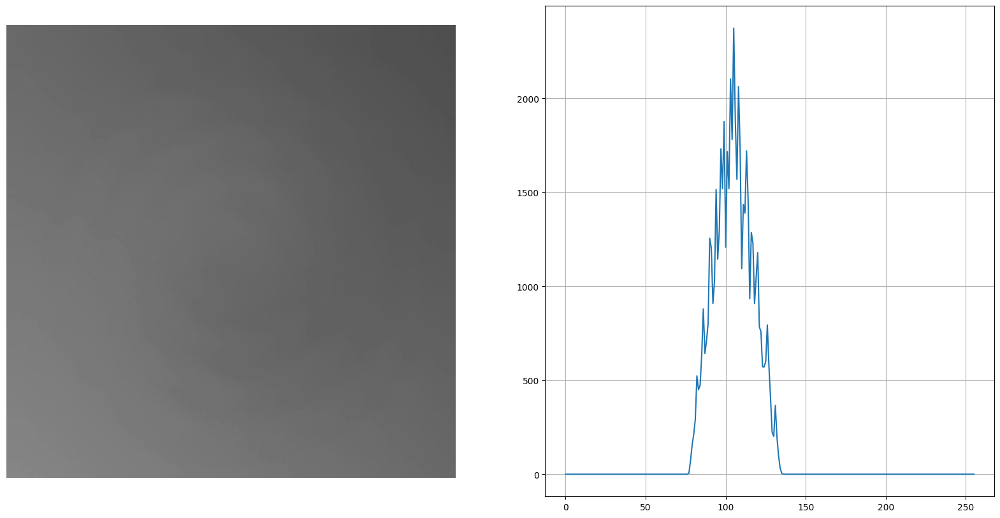

In [7]:
figHist, axsHist = plt.subplots(1, 2)
figHist.set_size_inches(20, 10)

axsHist[0].imshow(I1, 'gray', vmin=0, vmax=256)
axsHist[0].axis('off')

hist = cv2.calcHist([I1], [0], None, [256], [0, 256])
axsHist[1].plot(hist)
axsHist[1].grid()

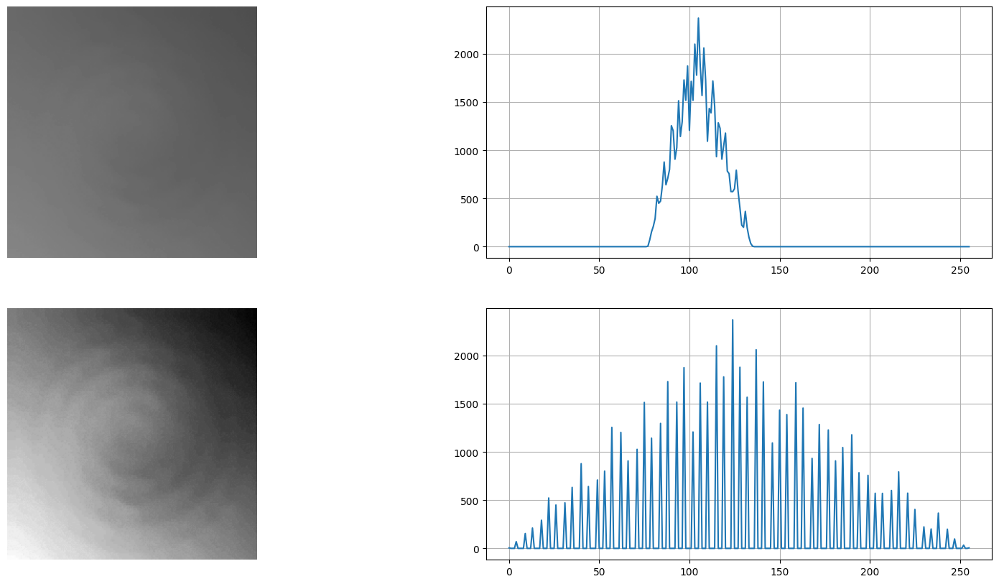

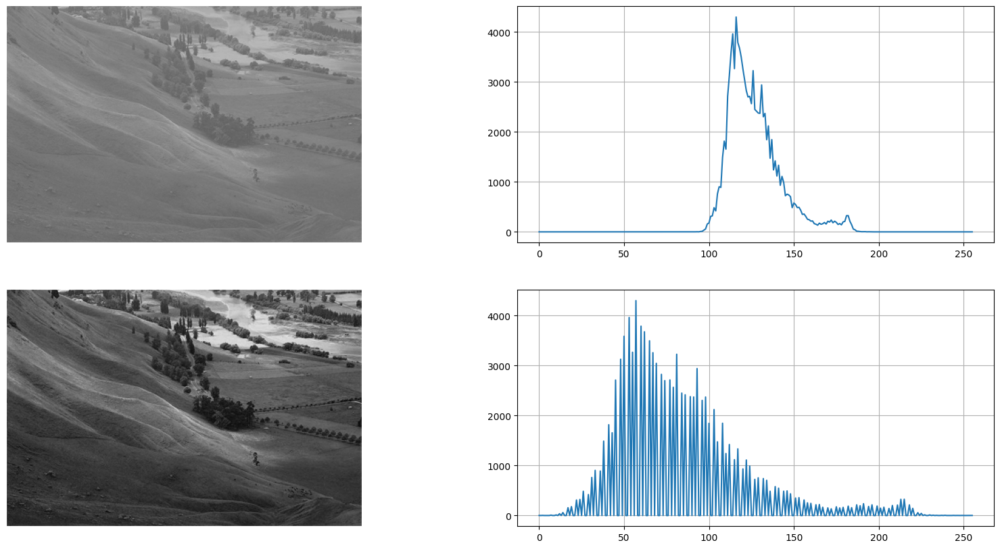

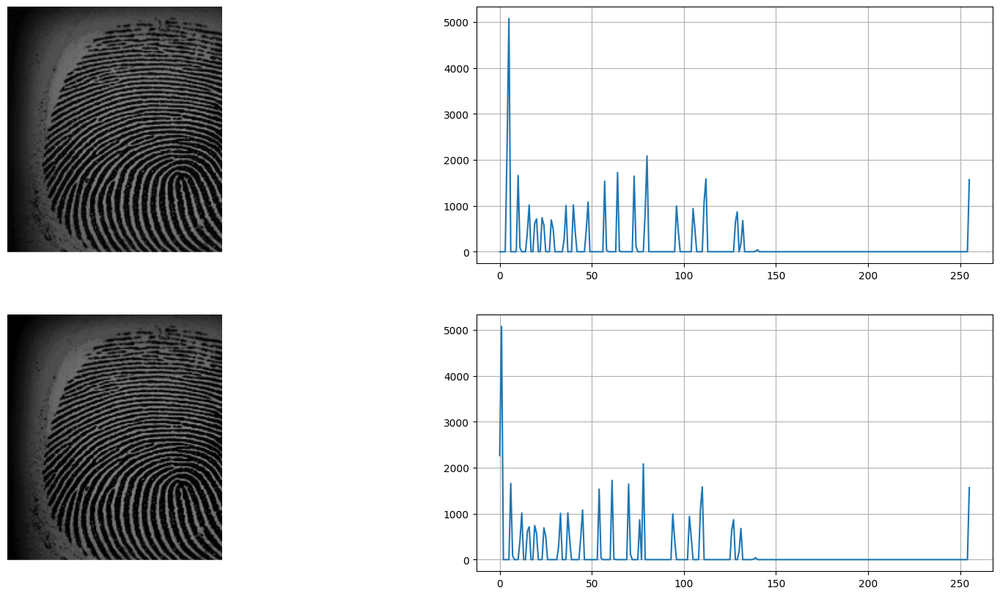

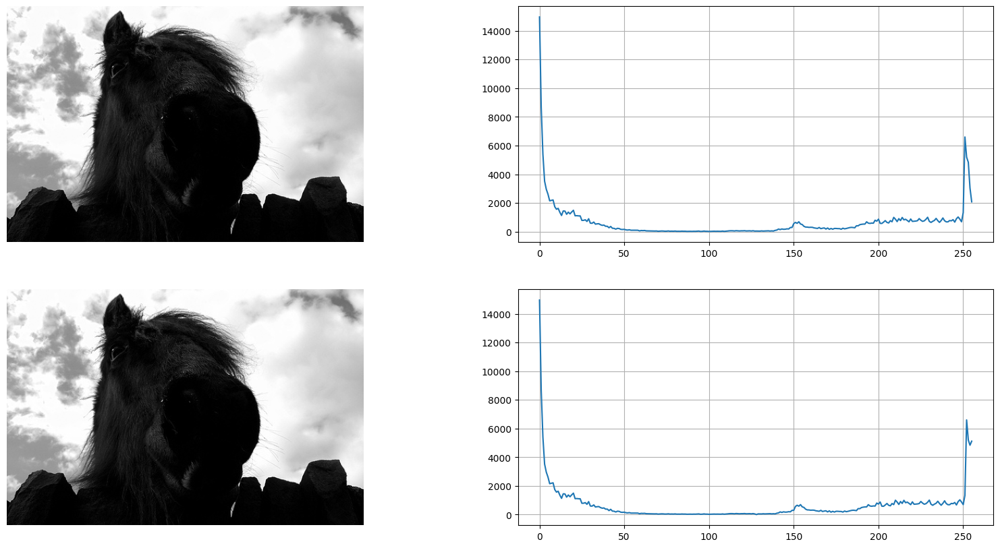

In [8]:
for img in [I1, I2, I3, I4]:
    figHist, axsHist = plt.subplots(2, 2)
    figHist.set_size_inches(20, 10)

    axsHist[0, 0].imshow(img, 'gray', vmin=0, vmax=256)
    axsHist[0, 0].axis('off')
    
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    axsHist[0, 1].plot(hist)
    axsHist[0, 1].grid()

    
    img_normalized = cv2.normalize(img, None, 0, 256, cv2.NORM_MINMAX)
    axsHist[1, 0].imshow(img_normalized, 'gray', vmin=0, vmax=256)
    axsHist[1, 0].axis('off')

    hist_normalized = cv2.calcHist([img_normalized], [0], None, [256], [0, 256])
    axsHist[1, 1].plot(hist_normalized)
    axsHist[1, 1].grid()

## Wyrównywanie histogramu

<div style="text-align: justify">
Bardziej zaawansowaną metodą jest tzw. wyrównywanie histogramu (ang. *histogram equalization – HE*).
Idea jest następująca: z punktu widzenia lepszego wykorzystania dostępnych poziomów jasności pożądane jest rozciągnięcie "szczytów" histogramu, a~skompresowanie "dolin" tak, aby taka sama liczba pikseli reprezentowana była przez każdy z dostępnych poziomów jasności (a przynjamniej przybliżona).
Warto zwrócić uwagę, że takie przekształcenie powoduje częściową utratę informacji o szczegółach w obszarach "dolin".
Inaczej mówiąc, dążymy do sytuacji, aby histogram był względnie jednostajny.
Operacją, która pozwala wykonać wyrównywanie histogramu, jest przekształcenie LUT z funkcją przejścia w postaci histogramu skumulowanego danego obrazu.</div><br>

<div style="text-align: justify">
Histogram skumulowany to funkcja obliczona na podstawie histogramu.
Jej pierwszy element to liczba pikseli o odcieniu $0$.
Kolejne wartości to liczba pikseli o odcieniach od $0$ do $n$.</div>

\begin{equation}
C(n) = \sum_{i=0}^{n} h(i)
\end{equation}

<div style="text-align: justify">
Jeżeli histogram jest w postaci znormalizowanej (gęstość rozkładu prawdopodobieństwa) to histogram skumulowany stanowi dystrybuantę rozkładu prawdopodobieństwa.</div><br>

1. Wyznacz histogram skumulowany dla obrazu *hist1.bmp*.
W tym celu wykorzystaj metodę `cumsum` dla histogramu wczytanego obrazu.
Nie przyjmuje ona żadnych argumentów, a zwraca skumulowane wartości tablicy, dla której została użyta.
Histogram należy wyliczyć dla **obrazka wejściowego**, a nie dla wyniku rozciągania.
2. Histogram skumulowany wyświetl razem z histogramem zwykłym na jednym wykresie (nie obok siebie).
Na potrzeby wyświetlenia przeskaluj histogram skumulowany tak, by miał taką samą wartość maksymalną jak zwykły histogram.
W tym celu wykorzystaj metodę `max`.
3. Wyświetlenie kilku linii na jednym wykresie może być zrealizowane w następujący sposób:
        figHistCum, axsHistCum = plt.subplots()

        axsHistCum.plot(HHist)
        axsHistCum.plot(CHistNorm)
        axsHistCum.grid()
4. Teraz zaimplementuj klasyczny algorytm wyrównywania histogramu.
Wykorzystać należy obliczony histogram skumulowany.
Należy go przeskalować w taki sposób aby na jego podstawie zrealizować przekształcenie LUT, czyli do zakresu 0 - 255.

>Uwaga. Opisany algorytm wyrównywania histogramu jest wersją uproszczoną.
>W wersji pełnej należy podczas skalowania tablicy przekodowań LUT pominąć elementy równe *0*.
>
>W tym celu należy wykorzystać funkcje `np.ma.masked_equal` i `np.ma.filled`.
>Pierwsza służy do ukrywania elementów tablicy, natomiast druga zamienia ukryte elementy na podaną wartość.
>W tym przypadku elementem ukrywanym i wpisywaną wartością byłoby *0*.

5. Na kolejnym rysunku wyświetl obrazek po przekształceniu, jego histogram oraz histogram skumulowany.
Co szczególnego można powiedzieć o jego histogramie i histogramie skumulowanym?
6. W bibliotece *OpenCV* dostępna jest funkcja wykonująca wyrównywanie histogramu `cv2.equalizeHist`.
Jej argumentem jest obraz, którego histogram zostanie wyrównany. Zwraca natomiast obraz wynikowy.
Na kolejnym rysunku wyświetl wynik funkcji, jego histogram oraz histogram skumulowany.
7. W wykorzystywanej bibliotece zaimplementowana jest również metoda adaptacyjnego wyrównywania histogramu algorytmem CLAHE (ang. *Contrast Limited Adaptive Histogram Equalization*}.
   Kilka słów wyjaśnienia.
   Wadą poznanej metody HE jest jej "globalność" rozumiana jako nieuwzględnianie lokalnych właściwości obrazu.
   Dlatego też powstała metoda adaptacyjnego wyrównywania histogramu (AHE).
   Jest ona spotykana w dwóch wariantach:
   - dla każdego piksela niezależnie, w pewnym jego otoczeniu, wyznaczany jest histogram i przeprowadzane wyrównywanie.
     Jak nietrudno się domyślić rozwiązanie jest dość kosztowne obliczeniowo.
   - obraz wejściowy dzielony jest na nienachodzące na siebie prostokątne okna.
     W każdym z okien obliczany jest histogram i przeprowadzane jest wyrównywanie.
     W celu eliminacji błędów na granicy okien, stosuje się interpolację.

   Metoda AHE ma jednak tą wadę, że w obszarach jednorodnych wzmacnia szum.
   Dlatego też zaproponowano rozwiązanie CLAHE, które zakłada ograniczenie kontrastu (CL).
   W metodzie definiuje się maksymalną wartość danego przedziału histogramu (próg ograniczenia kontrastu).
   Piksele, które przekraczają próg są następnie równomiernie rozdzielane pomiędzy poszczególne przedziały.
   Bardziej szczegółowy opis obu metod dostępny jest na [Wikipedii](https://en.wikipedia.org/wiki/Adaptive_histogram_equalization).

8.W celu użycia algorytmu należy wywołać funkcję `cv2.createCLAHE`.
    - Pierwszym parametrem jest próg ograniczenia kontrastu.
    - Drugi parametr definiuje na ile prostokątów zostanie podzielony obraz w rzęch i kolumnach.
    - Zwracany jest zainicjalizowany *smart pointer* do klasy `cv::CLAHE`.
9. Aby wykonać wyrównywanie należy użyć metody `apply`.
Jej argumentem jest obraz wejściowy. Zwracany jest obraz o zmodyfikowanym histogramie.
10. Przetestuj różne parametry algorytmu CLAHE.
11. W kolejnym etapie należy przetestować operacje (rozciąganie, wyrównywanie (HE) i adaptacyjne wyrównywanie CLAHE)  na histogramie dla obrazów rzeczywistych. *hist2.bmp*, *hist3.bmp*, *hist4.jpg*.
W jednym oknie wyświetl: obraz oryginalny, rozciąganie, wyrównywanie HE oraz wyrównywanie CLAHE.

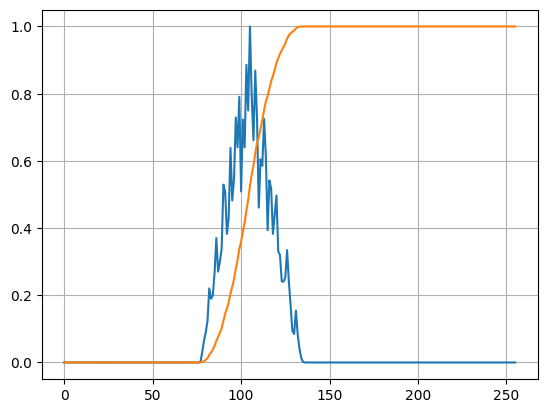

In [9]:
img = cv2.imread('hist1.bmp', cv2.IMREAD_GRAYSCALE)
hist = cv2.calcHist([img], [0], None, [256], [0, 256])
hist_accumulated = np.cumsum(hist)

fig, axs = plt.subplots()

axs.plot(hist / np.max(hist))
axs.plot(hist_accumulated / np.max(hist_accumulated))
axs.grid()

In [10]:
def equalize_hist(img):
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    hist_accumulated = np.cumsum(hist)
    
    img_normalized = (hist_accumulated[img] - np.min(hist_accumulated)) / (img.size - np.min(hist_accumulated)) * 255
    return img_normalized

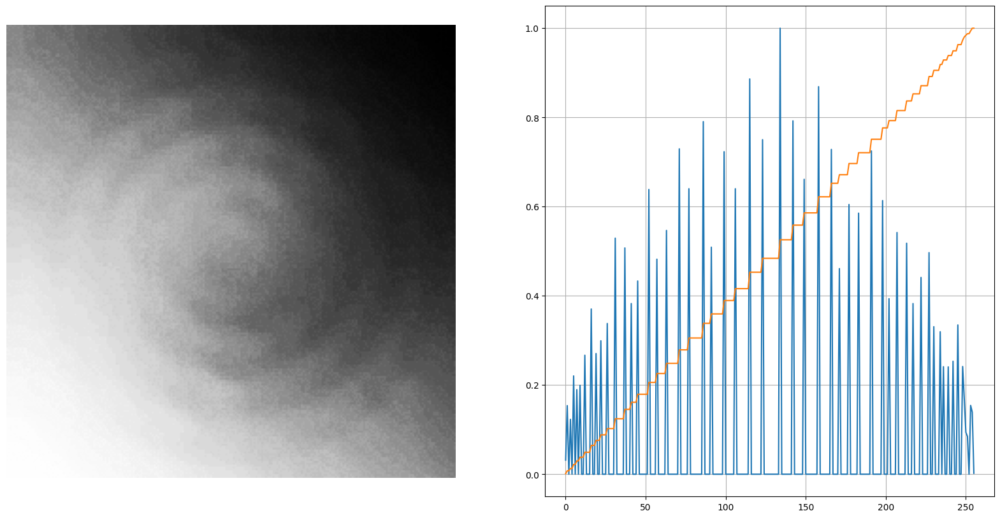

In [11]:
img = equalize_hist(cv2.imread('hist1.bmp', cv2.IMREAD_GRAYSCALE))
hist = cv2.calcHist([img], [0], None, [256], [0, 256])
hist_accumulated = np.cumsum(hist)

fig, axs = plt.subplots(1,2)
fig.set_size_inches(20, 10)

axs[0].imshow(img, 'gray', vmin=0, vmax=256)
axs[0].axis('off')

axs[1].plot(hist / np.max(hist))
axs[1].plot(hist_accumulated / np.max(hist_accumulated))
axs[1].grid()

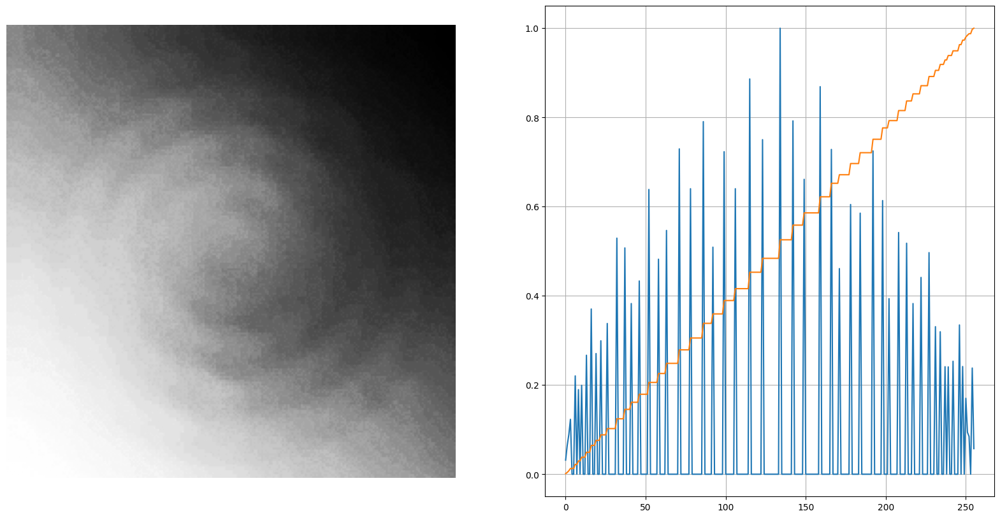

In [12]:
img = cv2.equalizeHist(cv2.imread('hist1.bmp', cv2.IMREAD_GRAYSCALE))
hist = cv2.calcHist([img], [0], None, [256], [0, 256])
hist_accumulated = np.cumsum(hist)

fig, axs = plt.subplots(1,2)
fig.set_size_inches(20, 10)

axs[0].imshow(img, 'gray', vmin=0, vmax=256)
axs[0].axis('off')

axs[1].plot(hist / np.max(hist))
axs[1].plot(hist_accumulated / np.max(hist_accumulated))
axs[1].grid()

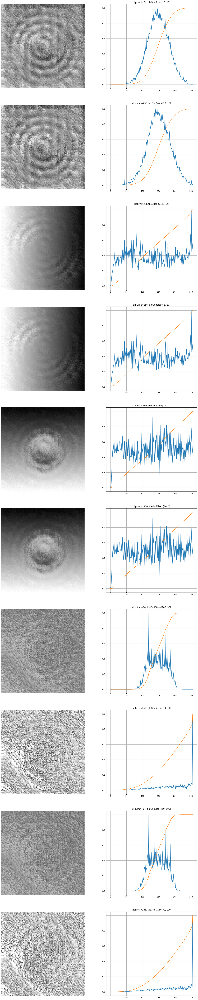

In [13]:
img = cv2.imread('hist1.bmp', cv2.IMREAD_GRAYSCALE)

params = [
    (64, [10, 10]),
    (256, [10, 10]),
    (64, [1, 20]),
    (256, [1, 20]),
    (64, [20, 1]),
    (256, [20, 1]),
    (64, [100, 50]),
    (256, [100, 50]),
    (64, [50, 100]),
    (256, [50, 100]),
]

fig, axs = plt.subplots(len(params), 2)
fig.set_size_inches(20, 10 * len(params))

for i, param in enumerate(params):
    clahe = cv2.createCLAHE(*param)

    img_equalized = clahe.apply(img)
    hist = cv2.calcHist([img_equalized], [0], None, [256], [0, 256])
    hist_accumulated = np.cumsum(hist)

    axs[i, 0].imshow(img_equalized, 'gray', vmin=0, vmax=256)
    axs[i, 0].axis('off')

    axs[i, 1].plot(hist / np.max(hist))
    axs[i, 1].plot(hist_accumulated / np.max(hist_accumulated))
    axs[i, 1].grid()
    axs[i, 1].set_title(f'clipLimit={param[0]}, tileGridSize={param[1]}')


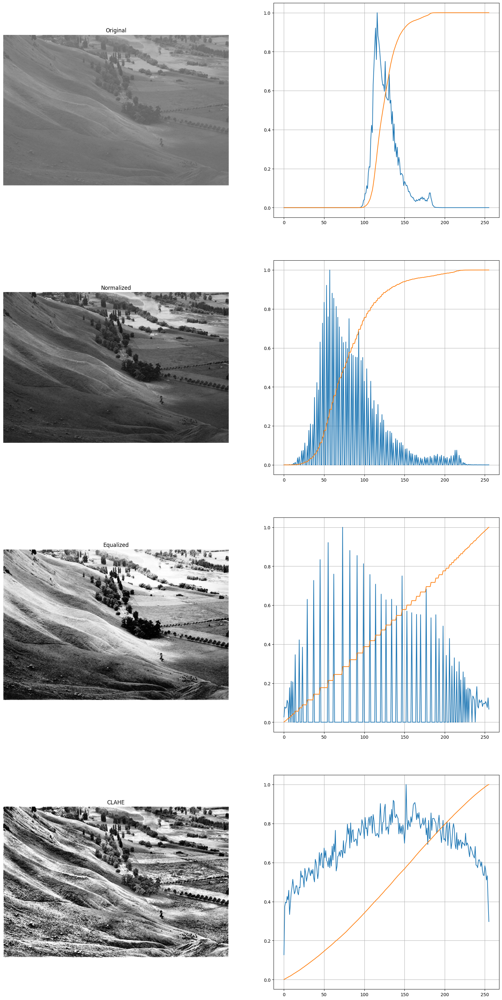

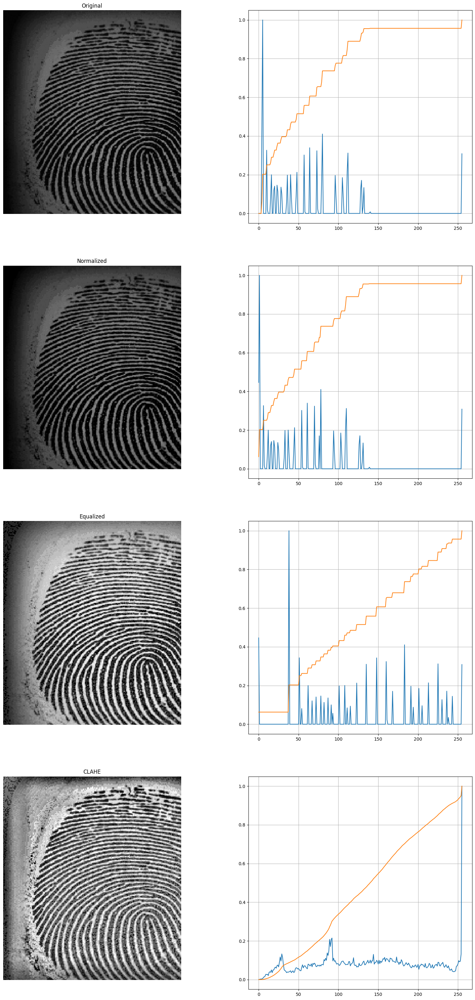

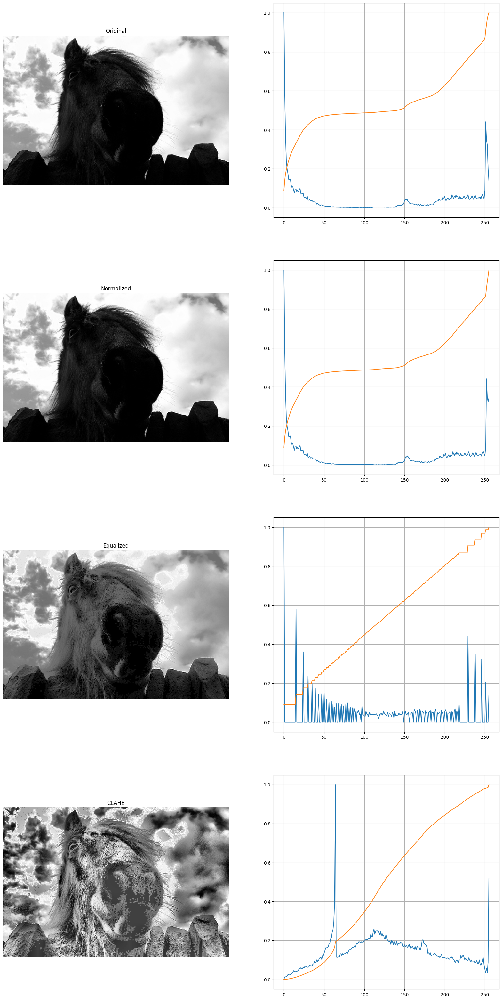

In [16]:
I2 = cv2.imread('hist2.bmp', cv2.IMREAD_GRAYSCALE)
I3 = cv2.imread('hist3.bmp', cv2.IMREAD_GRAYSCALE)
I4 = cv2.imread('hist4.bmp', cv2.IMREAD_GRAYSCALE)

for i, img in enumerate([I2, I3, I4]):
    img_normalized = cv2.normalize(img, None, 0, 256, cv2.NORM_MINMAX)
    img_equalized = cv2.equalizeHist(img)
    clahe = cv2.createCLAHE(clipLimit=64, tileGridSize=(10, 10))
    img_clahe = clahe.apply(img)

    fig, axs = plt.subplots(4, 2)
    fig.set_size_inches(20, 40)

    for i, (img, title) in enumerate([(img, 'Original'), (img_normalized, 'Normalized'), (img_equalized, 'Equalized'), (img_clahe, 'CLAHE')]):
        hist = cv2.calcHist([img], [0], None, [256], [0, 256])
        hist_accumulated = np.cumsum(hist)

        axs[i, 0].imshow(img, 'gray', vmin=0, vmax=256)
        axs[i, 0].axis('off')
        axs[i, 0].set_title(title)

        axs[i, 1].plot(hist / np.max(hist))
        axs[i, 1].plot(hist_accumulated / np.max(hist_accumulated))
        axs[i, 1].grid()

## Histogram dla obrazów kolorowych i jego wyrównywanie

1. Wczytaj obraz *lenaRGB.bmp*.
2. Wykonaj konwersję przestrzeni barw z BGR do RGB.
3. Wyświetl wczytany obraz oraz histogram dla każdej składowej przestrzeni barw.
W tym celu można użyć drugiego argumentu wykorzystywanej funkcji (numer kanału).
4. Wykonaj wyrównywanie dla każdej składowej obrazu. Połącz otrzymane składowe w nowy obraz i wyświetl go.
Jaka jest zasadnicza wada takiego podejścia?
5. Przekształć obraz wejściowy do przestrzeni HSV (flaga `cv2.COLOR_BGR2HSV`).
Wyświetl histogramy poszczególnych składowych.
Manipulacji dokonujemy na składowej odpowiadającej za jasność, czyli V.
Wykonaj wyrównywanie histogramu dla tej składowej.
Dokonaj podmiany składowej V i wyświetl rezultat operacji.
Uprzednio przeprowadź konwersję HSV->RGB (flaga `cv2.COLOR_HSV2RGB`).
6. Wykonaj te same operacje dla obrazu *jezioro.jpg*.

In [15]:
fileName = 'lenaRGB.bmp'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

fileName = 'jezioro.jpg'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

In [19]:
lena = cv2.imread('lenaRGB.bmp')
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2RGB)

jezioro = cv2.imread('jezioro.jpg')
jezioro = cv2.cvtColor(jezioro, cv2.COLOR_BGR2RGB)

In [22]:
def draw_histograms(img):
    fig, axs = plt.subplots(1, 4)
    fig.set_size_inches(20, 5)

    axs[0].imshow(img, vmin=0, vmax=256)
    axs[0].axis('off')

    for channel, name in {1: 'R', 2: 'G', 3: 'B'}.items():
        hist = cv2.calcHist([img], [channel - 1], None, [256], [0, 256])
        hist_accumulated = np.cumsum(hist)

        axs[channel].plot(hist / np.max(hist))
        axs[channel].plot(hist_accumulated / np.max(hist_accumulated))
        axs[channel].grid()
        axs[channel].set_title(f'Channel: {name}')

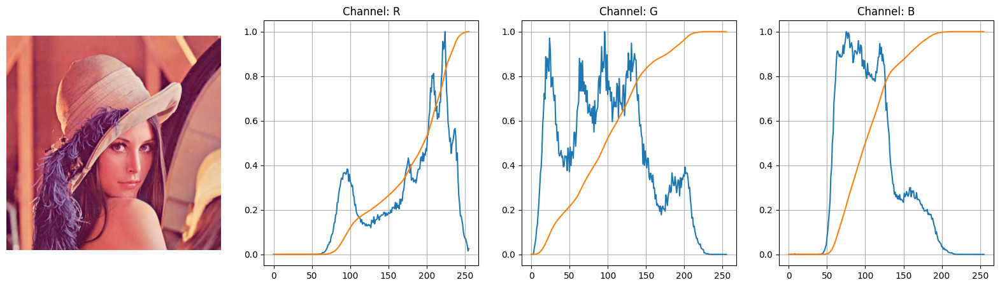

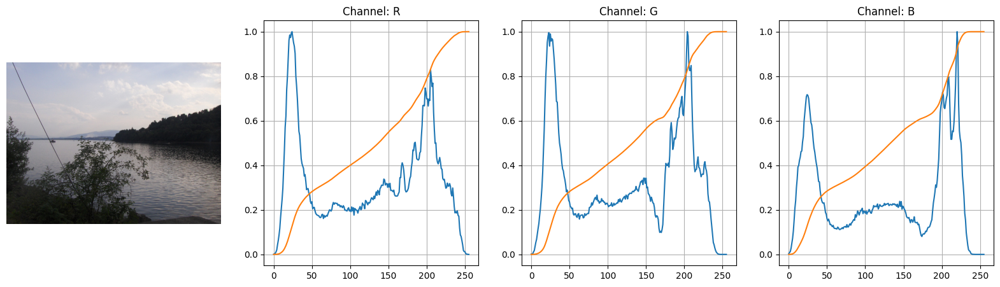

In [23]:
for img in [lena, jezioro]:
    draw_histograms(img)

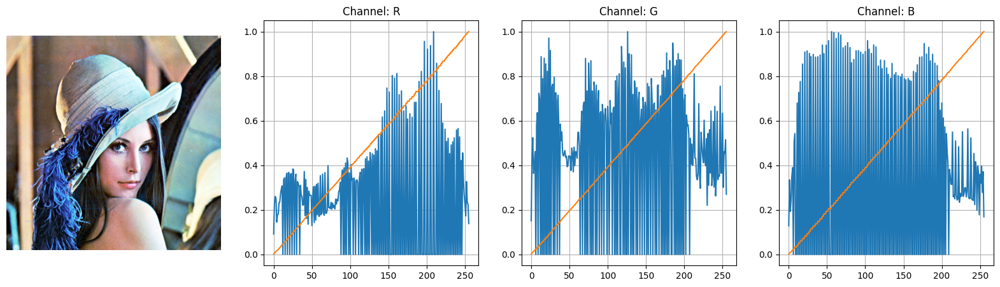

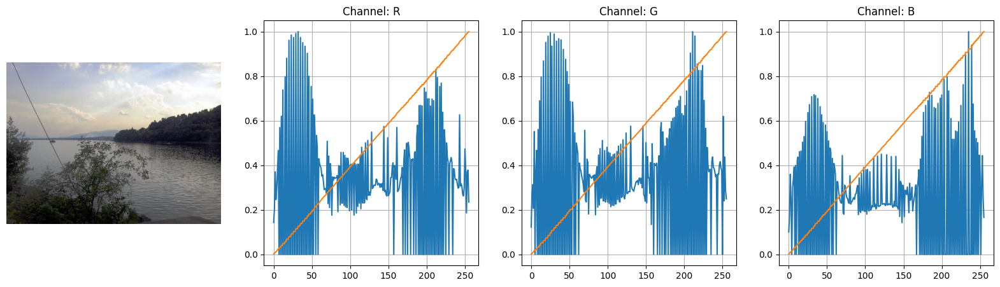

In [24]:
for img in [lena, jezioro]:
    for channel in range(3):
        img[:, :, channel] = cv2.equalizeHist(img[:, :, channel])
    
    draw_histograms(img)


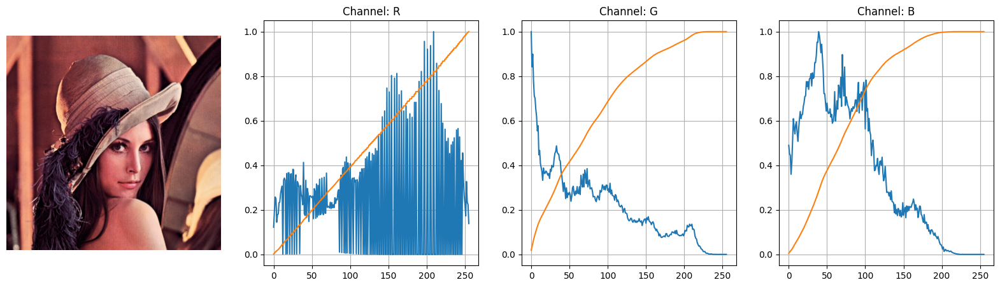

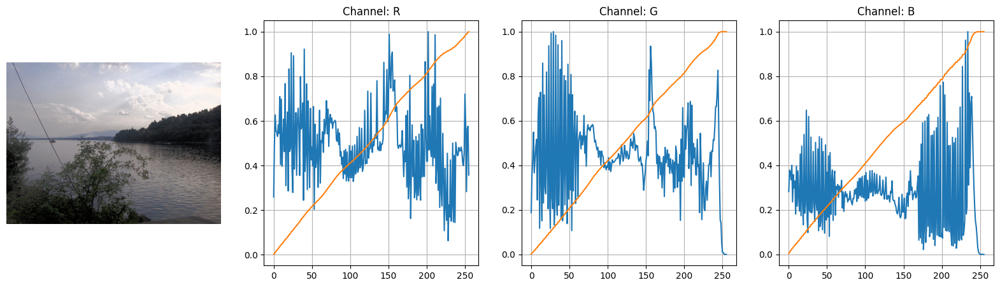

In [32]:
lena = cv2.imread('lenaRGB.bmp')
jezioro = cv2.imread('jezioro.jpg')

for img in [lena, jezioro]:
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    img_hsv[:, :, 2] = cv2.equalizeHist(img_hsv[:, :, 2])
    img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

    draw_histograms(img_rgb)